In [29]:
import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

In [30]:
def preprocess_image(image_path,target_size):
    image = cv2.imread(image_path)
    image = cv2.resize(image, target_size)
    image = image / 255.0
    return image

In [31]:

##%%
dataset_dir = 'IDC_regular_ps50_idx5/10262'
images = []
labels = []

for label in os.listdir(dataset_dir):
    class_dir = os.path.join(dataset_dir, label)
    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        image = preprocess_image(image_path, (128, 128))
        images.append(image)
        labels.append(0 if label == 'normal' else 1)  # Assuming labels are 'normal' and 'cancer'

images = np.array(images)
labels = np.array(labels)

# Split into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


In [32]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

C:\Users\smrut\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [33]:
datagen = ImageDataGenerator(rotation_range=20,
                             width_shift_range=0.2,
                             height_shift_range=0.2,
                             horizontal_flip=True)
datagen.fit(X_train)

model.fit(datagen.flow(X_train, y_train, batch_size=32),
          epochs=3,
          validation_data=(X_val, y_val))

Epoch 1/3


C:\Users\smrut\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


46/46 ━━━━━━━━━━━━━━━━━━━━ 19s 324ms/step - accuracy: 0.9114 - loss: 0.0671 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/3
46/46 ━━━━━━━━━━━━━━━━━━━━ 14s 294ms/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 3/3
46/46 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00


In [34]:
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 1.0000 - loss: 0.0000e+00
Test accuracy: 1.0


In [35]:
model.save('../models/ancer_detector.h5')

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import albumentations as A
from pathlib import Path
from collections import Counter
from tqdm.auto import tqdm
tqdm.pandas()
import random

In [37]:
slides = list(Path('IDC_regular_ps50_idx5').glob('*'))
len(slides)

279

In [38]:
def path_parser(p):
    p_id, idx, x, y, label = p.stem.split('_')
    return {
        'path': p,
        'patient_id': p_id,
        'idx': int(idx.replace('idx','')),
        'x': int(x[1:]),
        'y': int(y[1:]),
        'label': int(label.replace('class',''))
    }

def get_slices(slide_path):
    slices = list(slide_path.glob('*/*'))
    slices = map(path_parser, slices)
    slices = list(sorted(slices, key = lambda p:p['x'] + p['y']))
    return slices

def create_slide(slide_path):
    # help from: https://www.kaggle.com/code/allunia/breast-cancer/
    slices = get_slices(slide_path)
    max_x = max([s['x'] for s in slices])
    max_y = max([s['y'] for s in slices])

    slide = np.ones((max_x + 50, max_y + 50, 3)).astype(np.uint8) * 255
    mask = np.ones((max_x + 50, max_y + 50, 3)).astype(np.uint8) * 255
    errors = []

    for sl in tqdm(slices):

        im = np.array(Image.open(sl['path']).convert('RGB'))
        start_x, start_y = sl['x']-1, sl['y']-1
        end_x, end_y = start_x + 50, start_y + 50
        try:
            slide[start_y:end_y, start_x:end_x] = im
        except ValueError:
            errors.append(sl)
        if sl['label'] == 1:
            mask[start_y:end_y, start_x:end_x, :] = 0
            mask[start_y:end_y, start_x:end_x, 0] = 250

    return {
        'slide': slide,
        'mask': mask,
        'errors': errors
    }

In [39]:
def slide_viz(slide):
    fig,ax = plt.subplots(1,1,figsize=(24,24))
    ax.imshow(slide['mask'], alpha=0.8)
    ax.imshow(slide['slide'],alpha=0.7)
    plt.show()

  0%|          | 0/2031 [00:00<?, ?it/s]

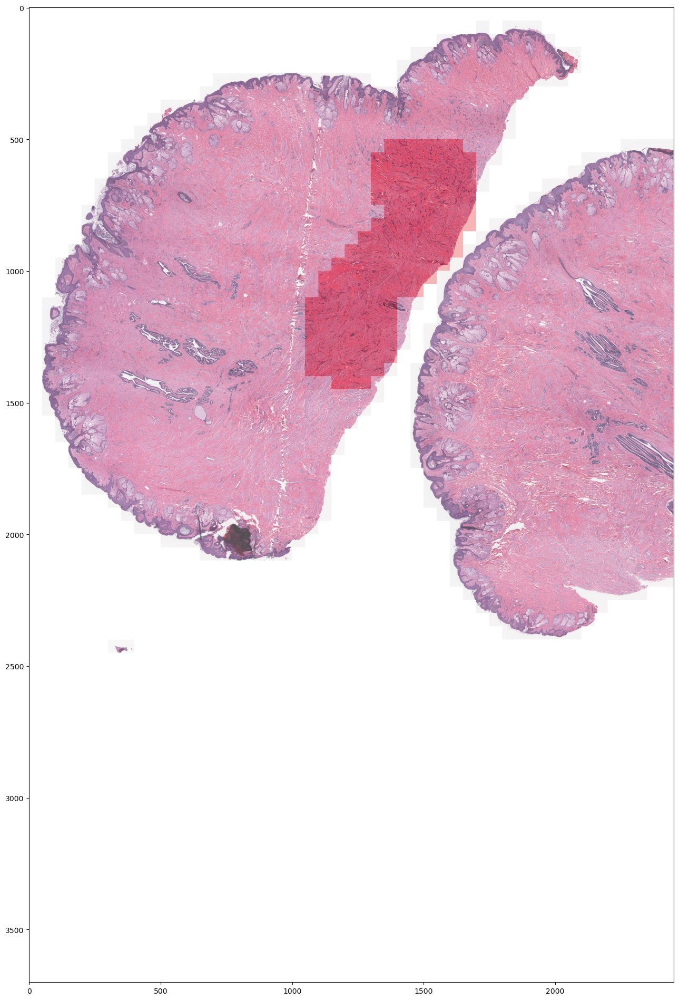

  0%|          | 0/1781 [00:00<?, ?it/s]

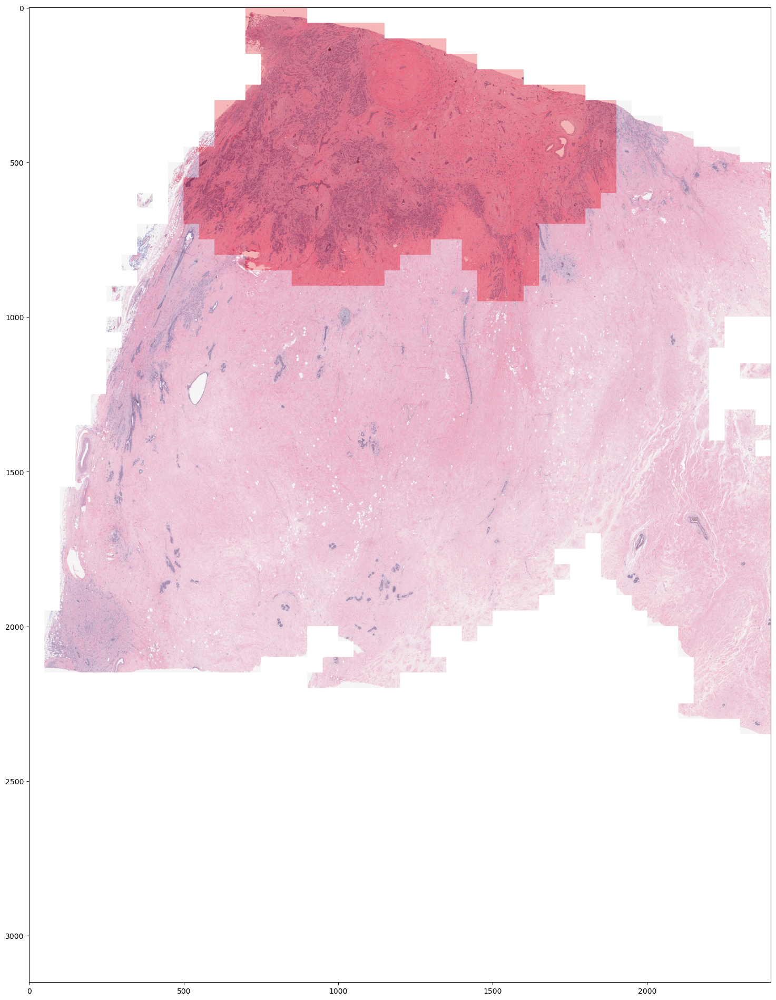

In [40]:
idxs = random.choices(range(len(slides)), k=2)
for idx in idxs:
    slide_viz(create_slide(slides[idx]))
    print()

In [41]:
zeros = list(Path('IDC_regular_ps50_idx5').glob('*/0/*'))
ones = list(Path('IDC_regular_ps50_idx5').glob('*/1/*'))

In [42]:
df = pd.DataFrame({'path':zeros+ones})
df['label'] = df['path'].map(lambda p:int(p.parent.stem))
df['patient'] = df['path'].map(lambda p:p.parent.parent.stem)

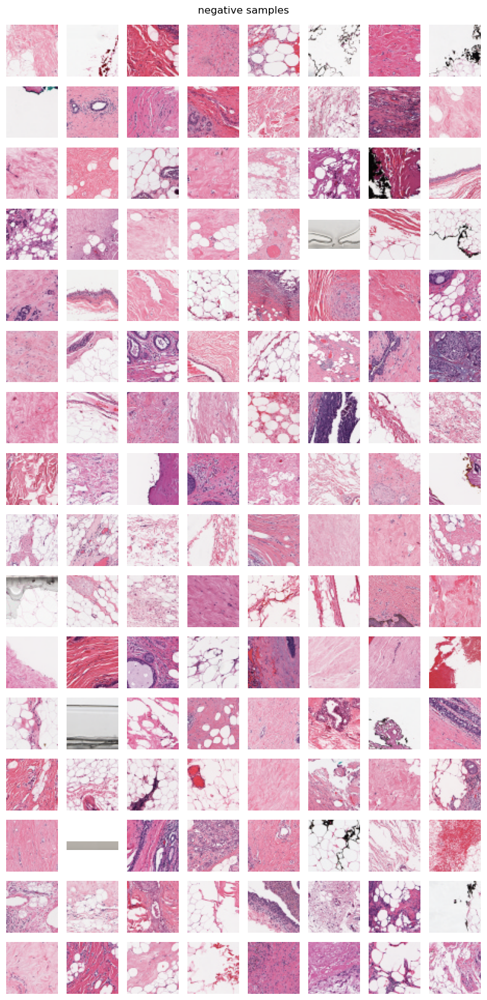

In [43]:
z = df[df['label']==0].sample(n=128)['path']
fig,axs = plt.subplots(16,8,figsize=(8,16),)
axs = axs.flatten()
for i,p in enumerate(z):
    im = Image.open(p).convert('RGB')
    axs[i].imshow(im)
    axs[i].axis('off')
plt.tight_layout()
plt.suptitle('negative samples',y=1.01)
plt.show()

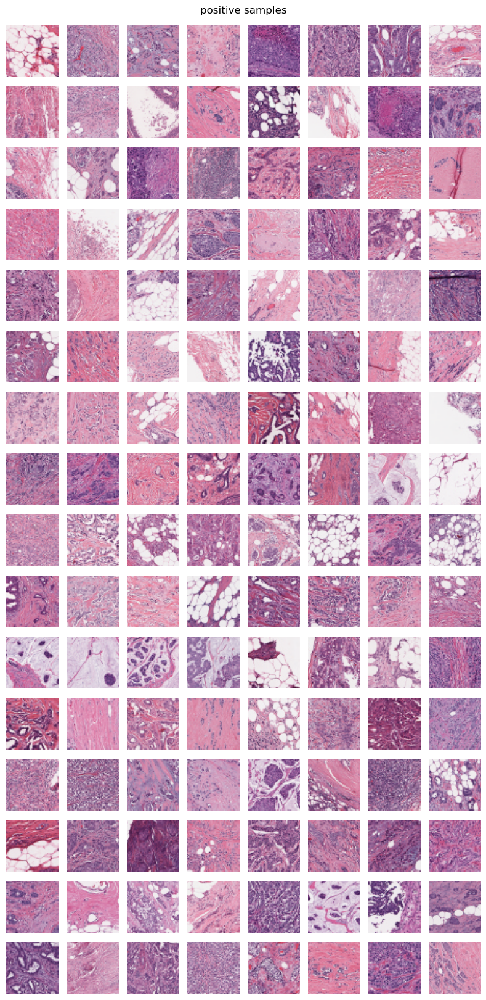

In [44]:
o = df[df['label']==1].sample(n=128)['path']
fig,axs = plt.subplots(16,8,figsize=(8,16),)
axs = axs.flatten()
for i,p in enumerate(o):
    im = Image.open(p).convert('RGB')
    axs[i].imshow(im)
    axs[i].axis('off')
plt.tight_layout()
plt.suptitle('positive samples',y=1.01)
plt.show()


In [45]:
def make_grid(p_id, pos, neg):

    fig = plt.figure(constrained_layout=True,figsize=(8,4))
    subfigs = fig.subfigures(1,2,wspace=0.2)

    for fig_idx, f in enumerate(subfigs.flat):
        images = neg if fig_idx == 0 else pos
        f.suptitle('negative' if fig_idx==0 else 'positive')
        images = [np.array(Image.open(im['path']).convert('RGB')) for im in images]
        axs = f.subplots(4,4)
        for i,ax in enumerate(axs.flatten()):
            ax.imshow(images[i])
            ax.axis('off')
    fig.suptitle(f'patient {p_id}')
    plt.show()

def viz_patient(slides, idx):
    patient = get_slices(slides[idx])
    pos = random.choices([sl for sl in patient if sl['label']==1],k=16)
    neg = random.choices([sl for sl in patient if sl['label']==0],k=16)
    p_id = pos[0]['patient_id']
    make_grid(p_id,pos,neg)

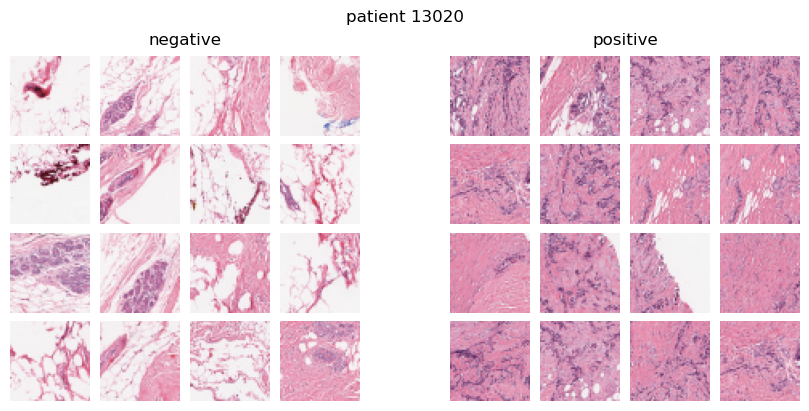

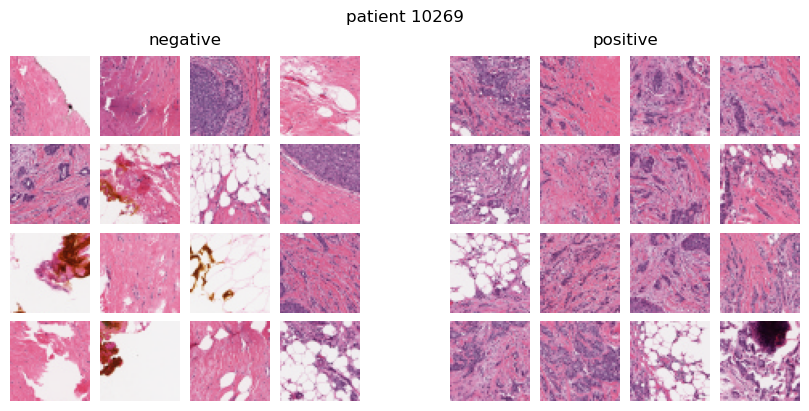

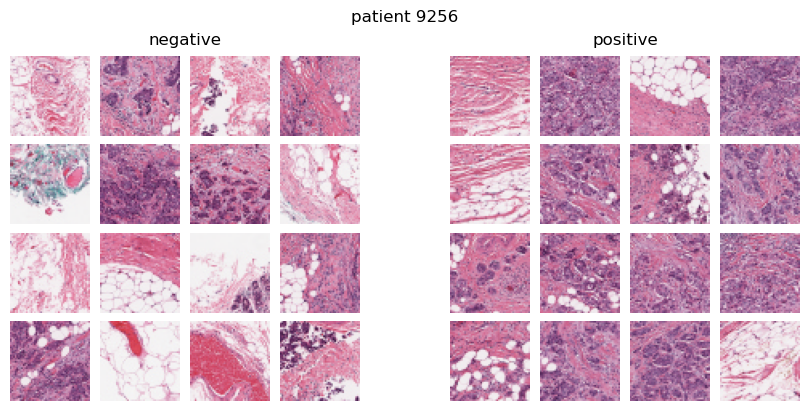

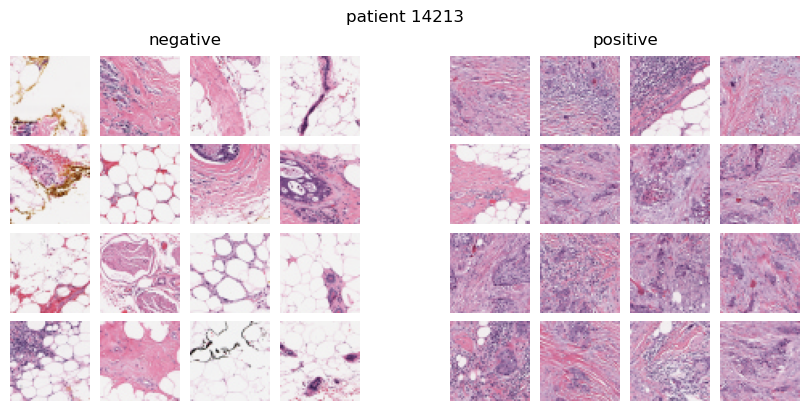

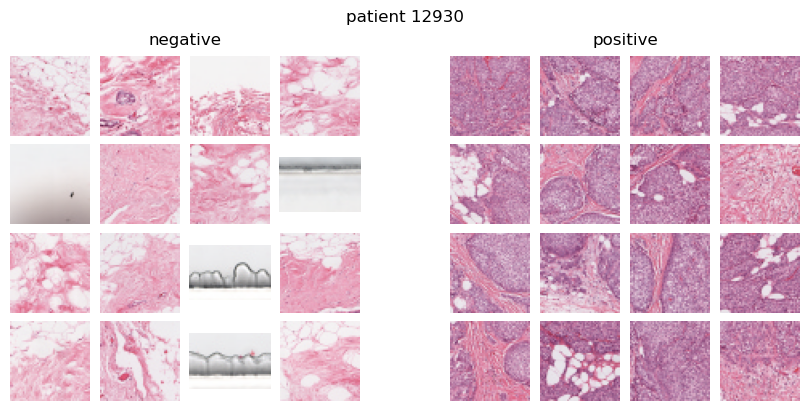

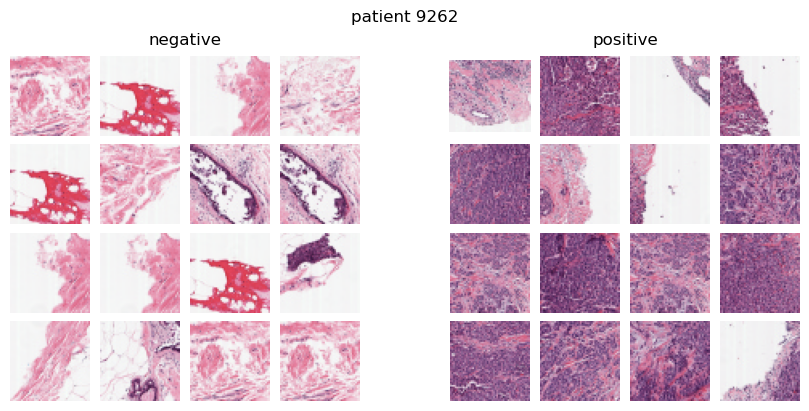

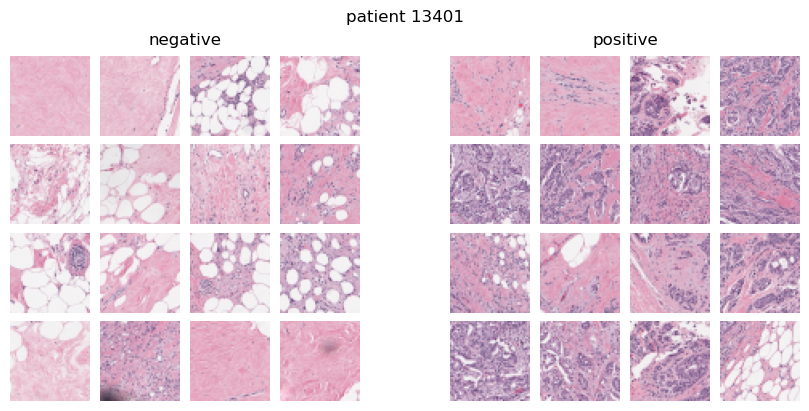

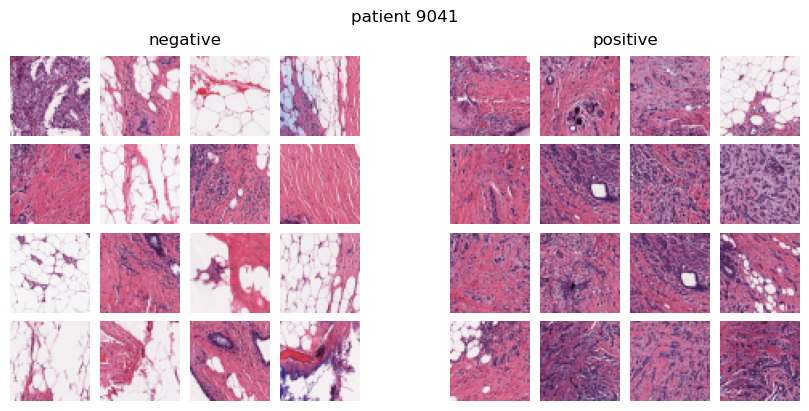

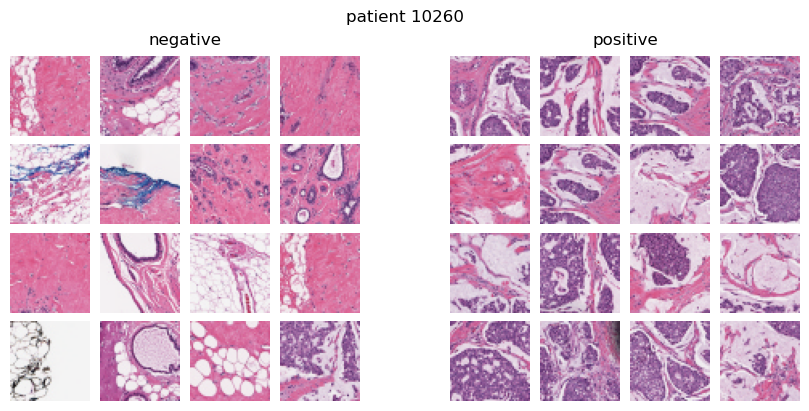

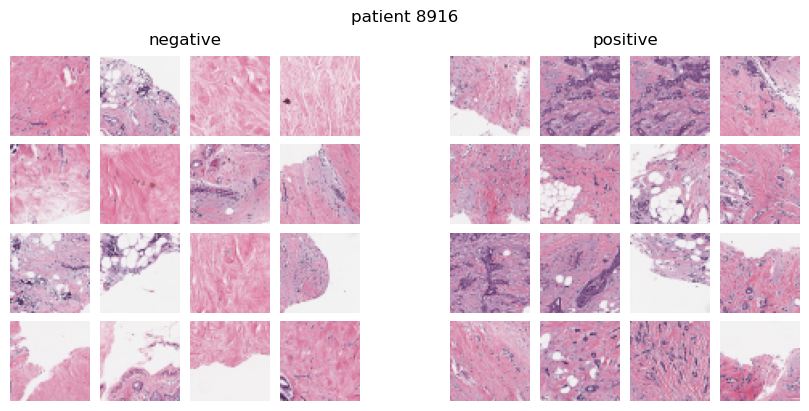

In [46]:
idxs = random.choices(range(len(slides)),k=10)
for idx in idxs:
    viz_patient(slides, idx)
    print()